In [2]:
import numpy as np
from scipy.sparse import csc_matrix,coo_matrix
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
from numpy import linalg as LA
from scipy.sparse.linalg import svds, eigs
from sklearn.decomposition import PCA,TruncatedSVD
import pickle
import pandas as pd
from random import randint
import umap
import kmapper as km
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN, KMeans, AffinityPropagation, MeanShift
import networkx as nx
from sklearn.preprocessing import MinMaxScaler
from community import best_partition # this is not part of networkx
from matplotlib.colors import ListedColormap
from scipy import ndimage
import imageio
import os
from kmapper.cover import Cover

def bbox(img):
    rows = np.any(img, axis=1)
    cols = np.any(img, axis=0)
    rmin, rmax = np.where(rows)[0][[0, -1]]
    cmin, cmax = np.where(cols)[0][[0, -1]]

    return rmin, rmax, cmin, cmax    

In [3]:
# %matplotlib
widths = []
heights = []
target = []

directory = '/home/garner1/Downloads/Classification_single_cells copy/Classification_single_cells copy/Cancer'
for img in os.listdir(directory):
    filename = os.path.join(directory, img)
    img = imageio.imread(filename)
    rmin, rmax, cmin, cmax = bbox(img)
    width = rmax-rmin
    height = cmax-cmin
    widths.append(width)
    heights.append(height)
    target.append(0)

directory = '/home/garner1/Downloads/Classification_single_cells copy/Classification_single_cells copy/Immuno'
for img in os.listdir(directory):
    filename = os.path.join(directory, img)
    img = imageio.imread(filename)
    rmin, rmax, cmin, cmax = bbox(img)
    width = rmax-rmin
    height = cmax-cmin
    widths.append(width)
    heights.append(height)
    target.append(1)

directory = '/home/garner1/Downloads/Classification_single_cells copy/Classification_single_cells copy/Other'
for img in os.listdir(directory):
    filename = os.path.join(directory, img)
    img = imageio.imread(filename)
    rmin, rmax, cmin, cmax = bbox(img)
    width = rmax-rmin
    height = cmax-cmin
    widths.append(width)
    heights.append(height)
    target.append(2)
    
Mwidths = max(widths)
Mheights = max(heights)
print(Mwidths,Mheights)

(47, 54)


In [4]:
nullimg = np.zeros(Mwidths,Mheights)
images = []
directory = '/home/garner1/Downloads/Classification_single_cells copy/Classification_single_cells copy/Cancer'
for img in os.listdir(directory):
    filename = os.path.join(directory, img)
    img = imageio.imread(filename)
    rmin, rmax, cmin, cmax = bbox(img)
    padwidth = int(Mwidths-(rmax-rmin))
    padheight = int(Mheights-(cmax-cmin))
    newimg = np.pad(img[rmin:rmax,cmin:cmax],((0,padwidth),(0,padheight)),'constant', constant_values=(0))
    images.append(newimg)
directory = '/home/garner1/Downloads/Classification_single_cells copy/Classification_single_cells copy/Immuno'
for img in os.listdir(directory):
    filename = os.path.join(directory, img)
    img = imageio.imread(filename)
    rmin, rmax, cmin, cmax = bbox(img)
    padwidth = int(Mwidths-(rmax-rmin))
    padheight = int(Mheights-(cmax-cmin))
    newimg = np.pad(img[rmin:rmax,cmin:cmax],((0,padwidth),(0,padheight)),'constant', constant_values=(0))
    images.append(newimg)
directory = '/home/garner1/Downloads/Classification_single_cells copy/Classification_single_cells copy/Other'
for img in os.listdir(directory):
    filename = os.path.join(directory, img)
    img = imageio.imread(filename)
    rmin, rmax, cmin, cmax = bbox(img)
    padwidth = int(Mwidths-(rmax-rmin))
    padheight = int(Mheights-(cmax-cmin))
    newimg = np.pad(img[rmin:rmax,cmin:cmax],((0,padwidth),(0,padheight)),'constant', constant_values=(0))
    images.append(newimg)

print(len(images))

600


In [4]:
sns.set(style='white', context='notebook', rc={'figure.figsize':(168,120)})

fig, ax_array = plt.subplots(30,20)
axes = ax_array.flatten()
for i, ax in enumerate(axes):
    ax.imshow(images[i], cmap='gray_r')
plt.setp(axes, xticks=[], yticks=[], frame_on=False)
plt.tight_layout(h_pad=0.5, w_pad=0.01)

In [5]:
data = np.zeros((Mwidths*Mheights,len(images)))
for ind in range(len(images)): data[:,ind] = images[ind].flatten() # from 2D arrays to 1D arrays
data = data.transpose()

In [6]:
data = np.zeros((Mwidths*Mheights,len(images)))
for ind in range(len(images)): data[:,ind] = images[ind].flatten() # from 2D arrays to 1D arrays
data = data.transpose()

'''Initialize'''
mapper = km.KeplerMapper(verbose=1)

'''Fit to and transform the data'''
projected_data = mapper.fit_transform(data, projection=umap.UMAP(n_components=3, n_neighbors=40, 
                                             a=None, angular_rp_forest=False, b=None, init='spectral',
                                           learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
                                           metric_kwds=None, min_dist=0.1, n_epochs=500,
                                           negative_sample_rate=10, random_state=47,
                                           repulsion_strength=1.0, set_op_mix_ratio=0.5, spread=1.0,
                                           target_metric='categorical', target_metric_kwds=None,
                                           target_n_neighbors=-1, target_weight=0.5, transform_queue_size=10.0,
                                           transform_seed=42, verbose=False))

# projected_data = mapper.fit_transform(data, projection=PCA(n_components=4))

KeplerMapper()
..Composing projection pipeline of length 1:
	Projections: UMAP(a=None, angular_rp_forest=False, b=None, init='spectral',
   learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
   metric_kwds=None, min_dist=0.1, n_components=3, n_epochs=500,
   n_neighbors=40, negative_sample_rate=10, random_state=47,
   repulsion_strength=1.0, set_op_mix_ratio=0.5, spread=1.0,
   target_metric='categorical', target_metric_kwds=None,
   target_n_neighbors=-1, target_weight=0.5, transform_queue_size=10.0,
   transform_seed=42, verbose=False)
	Distance matrices: False
	Scalers: MinMaxScaler(copy=True, feature_range=(0, 1))
..Projecting on data shaped (600, 2538)

..Projecting data using: 
	UMAP(a=None, angular_rp_forest=False, b=None, init='spectral',
   learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
   metric_kwds=None, min_dist=0.1, n_components=3, n_epochs=500,
   n_neighbors=40, negative_sample_rate=10, random_state=47,
   repulsion_strength=1.0, set_op_mix_r

In [7]:
'''Create dictionary called 'graph' with nodes, edges and meta-information'''
n_cubes = 10
graph = mapper.map(projected_data, data,
                   clusterer=KMeans(n_clusters=1,random_state=3471),
                   cover=Cover(n_cubes=n_cubes, perc_overlap=0.3))
# DBSCAN(eps=0.9, min_samples=3)
# KMeans(n_clusters=2,random_state=3471)
# MeanShift(bandwidth=None, seeds=None, bin_seeding=False,min_bin_freq=1, cluster_all=True, n_jobs=-1),
'''Visualize the mapper graph'''
mapper.visualize(graph)

Mapping on data shaped (600, 2538) using lens shaped (600, 3)

Creating 1000 hypercubes.

Created 1309 edges and 366 nodes in 0:00:02.064677.
Wrote visualization to: mapper_visualization_output.html


u'<!DOCTYPE html>\n<html>\n\n<head>\n  <meta charset="utf-8">\n  <meta name="generator" content="KeplerMapper">\n  <title>Kepler Mapper | KeplerMapper</title>\n\n  <link rel="icon" type="image/png" href="http://i.imgur.com/axOG6GJ.jpg" />\n\n  <link href=\'https://fonts.googleapis.com/css?family=Roboto+Mono:700,300\' rel=\'stylesheet\' type=\'text/css\'>\n  <style>* {\n  margin: 0;\n  padding: 0;\n}\n\nhtml, body {\n  height: 100%;\n}\n\nbody {\n  font-family: "Roboto Mono", "Helvetica", sans-serif;\n  font-size: 14px;\n}\n\n#logo {\n  position: absolute;\n  right: 00px;\n  top: 0px;\n  width: 90px;\n  height: 90px;\n  z-index: 999999;\n}\n\n#display {\n  color: #95A5A6;\n  background: #212121;\n}\n\n#print {\n  color: #000;\n  background: #FFF;\n}\n\nh1 {\n  font-size: 21px;\n  font-weight: 300;\n  font-weight: 300;\n}\n\nh2 {\n  font-size: 18px;\n  padding-bottom: 20px;\n  font-weight: 300;\n}\n\nh3 {\n  font-size: 14px;\n  font-weight: 700;\n  text-transform: uppercase;\n}\n\nh4 {\n

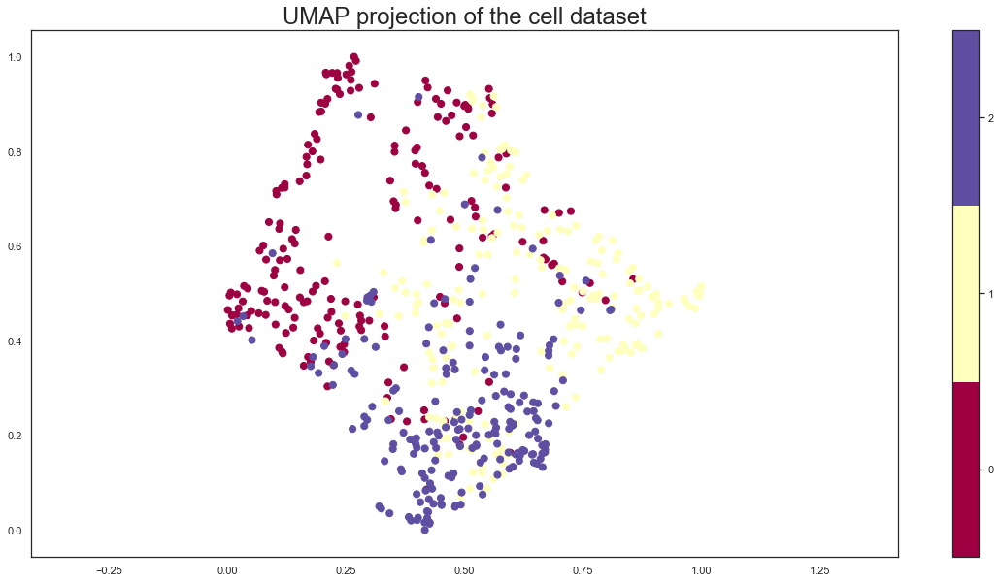

In [8]:
sns.set(style='white', context='notebook', rc={'figure.figsize':(20,10)})

plt.scatter(projected_data[:, 0], projected_data[:, 1], c=np.asarray(target), cmap='Spectral', s=50)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(4)-0.5).set_ticks(np.arange(3))
plt.title('UMAP projection of the cell dataset', fontsize=24);

In [9]:
# Import dependencies
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

# Configure the trace.
trace = go.Scatter3d(
    x=projected_data[:,0],  # <-- Put your data instead
    y=projected_data[:,1],  # <-- Put your data instead
    z=projected_data[:,2],  # <-- Put your data instead
    mode='markers',
    marker=dict(color=np.asarray(target),size=5, opacity=1)
)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

data = [trace]

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)

In [10]:
'''Build the network'''
net = km.to_networkx(graph)
print nx.info(net)

Name: 
Type: Graph
Number of nodes: 366
Number of edges: 1309
Average degree:   7.1530


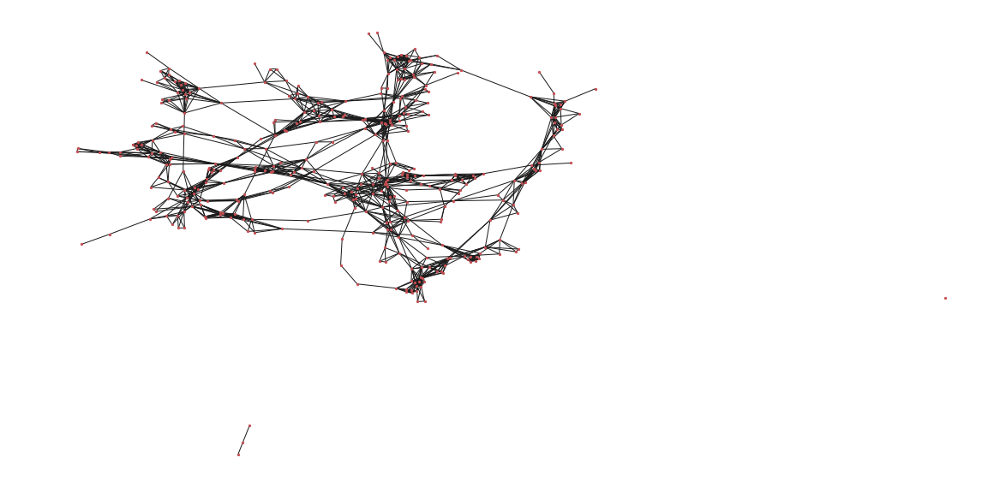

In [11]:
'''Create network layout for visualizations'''
spring_pos = nx.spring_layout(net)
plt.figure()
plt.axis("off")
nx.draw_networkx(net, pos = spring_pos, with_labels = False, node_size = 5)

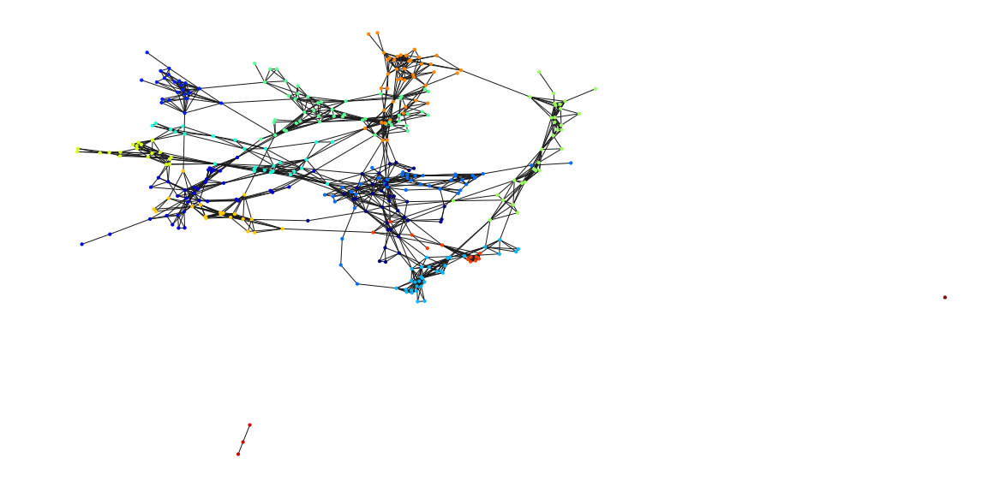

In [12]:
'''Partition the network'''
parts = best_partition(net)
values = [parts.get(node) for node in net.nodes()]
plt.figure()
plt.axis("off")
nx.draw_networkx(net, pos = spring_pos, cmap = plt.get_cmap("jet"), 
                 node_color = values, node_size = 10, with_labels = False)

In [13]:
'''Get all the nodes in a module'''
groups = []
for value in set(parts.values()):
    value_keys = [node for node in parts.keys() if value == parts[node]]
    groups.append(value_keys) 

0
1
2
3
4
5
6
7
8
9
10
11
12
13


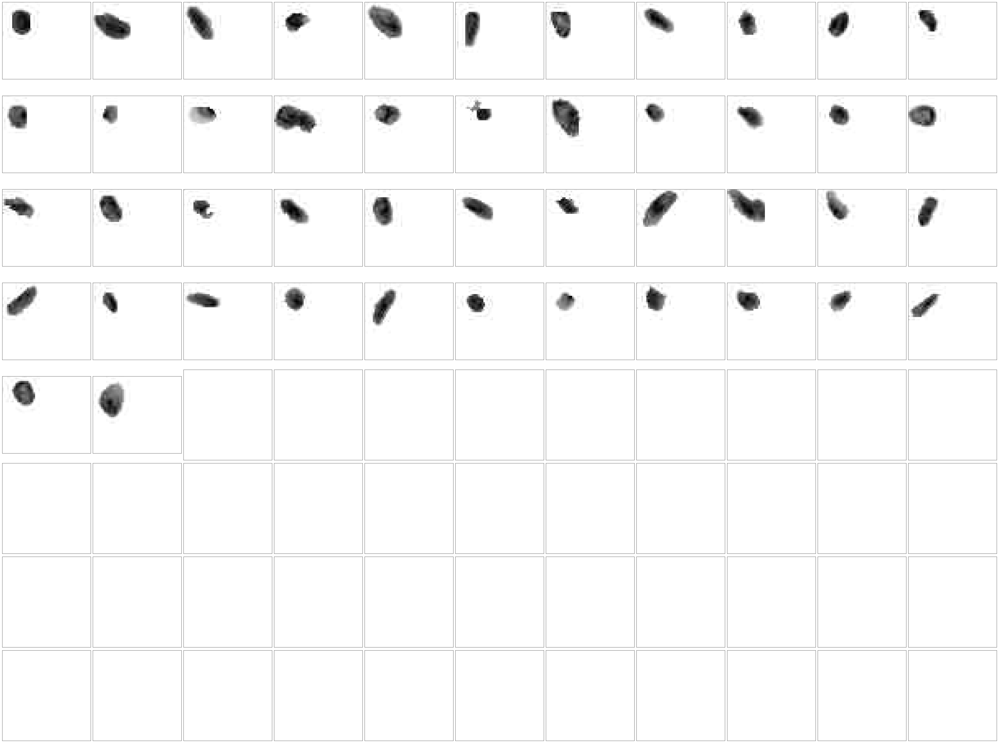

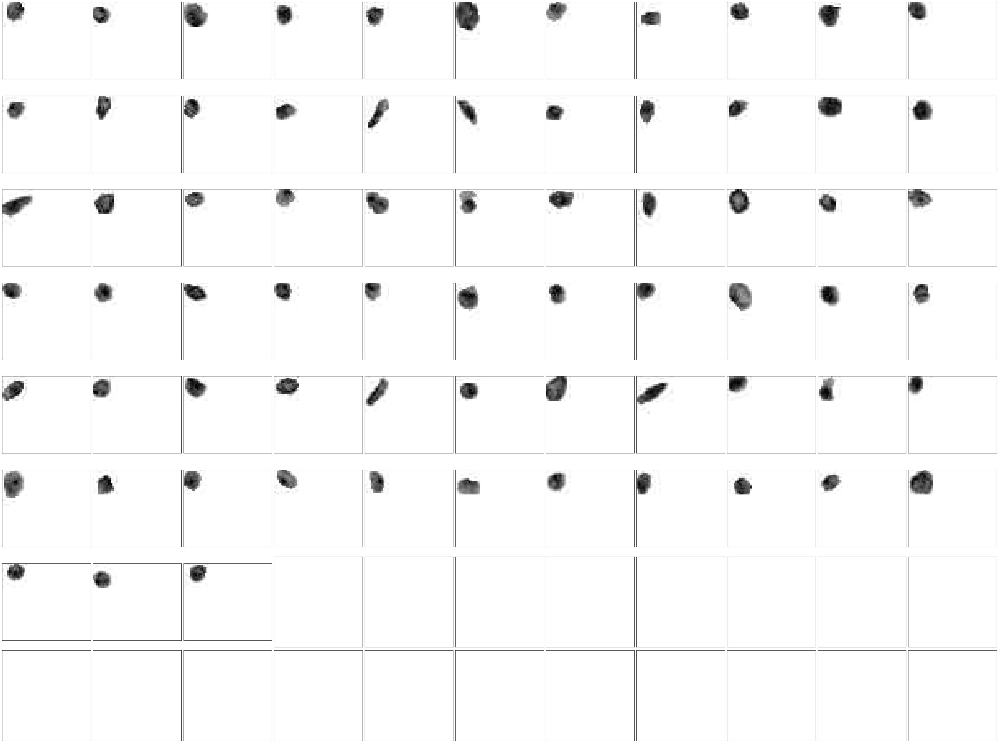

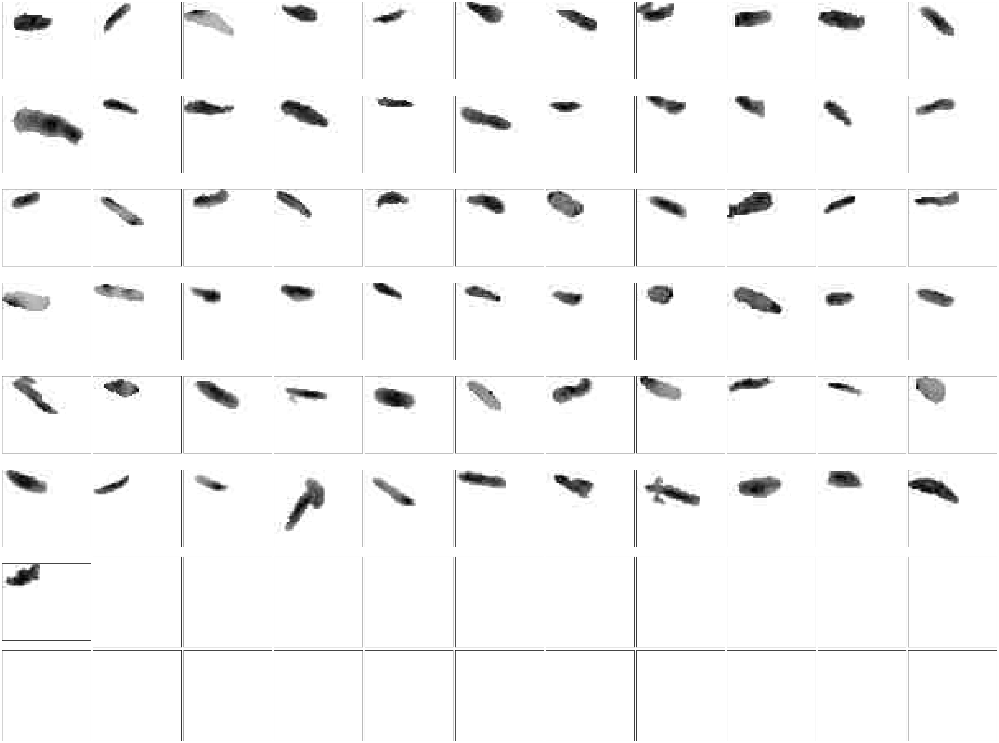

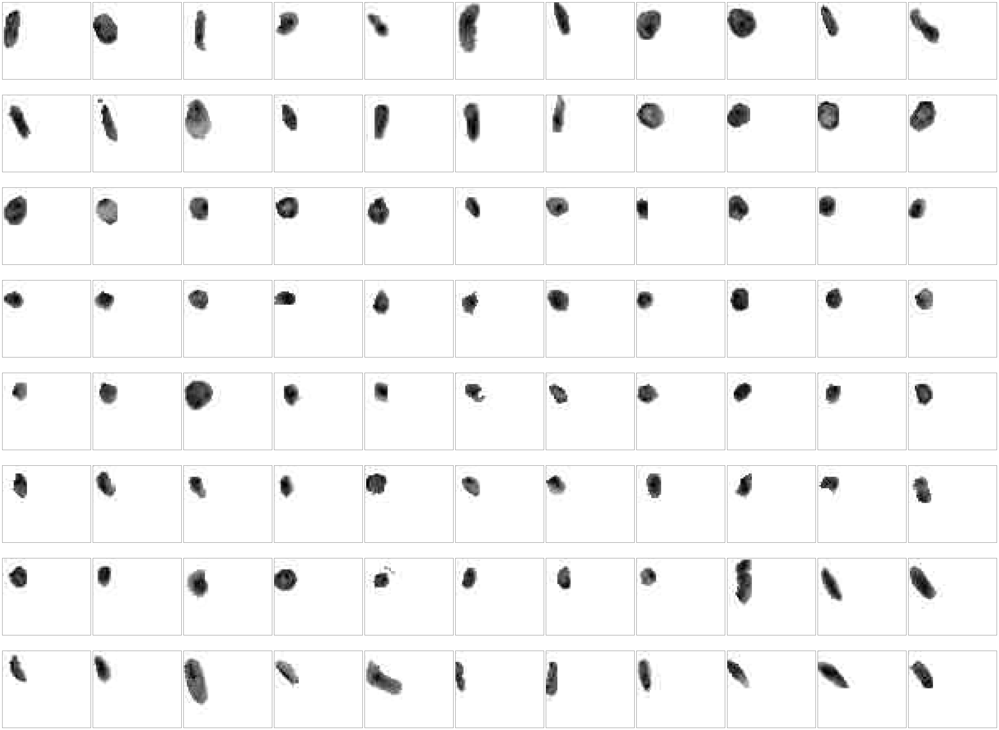

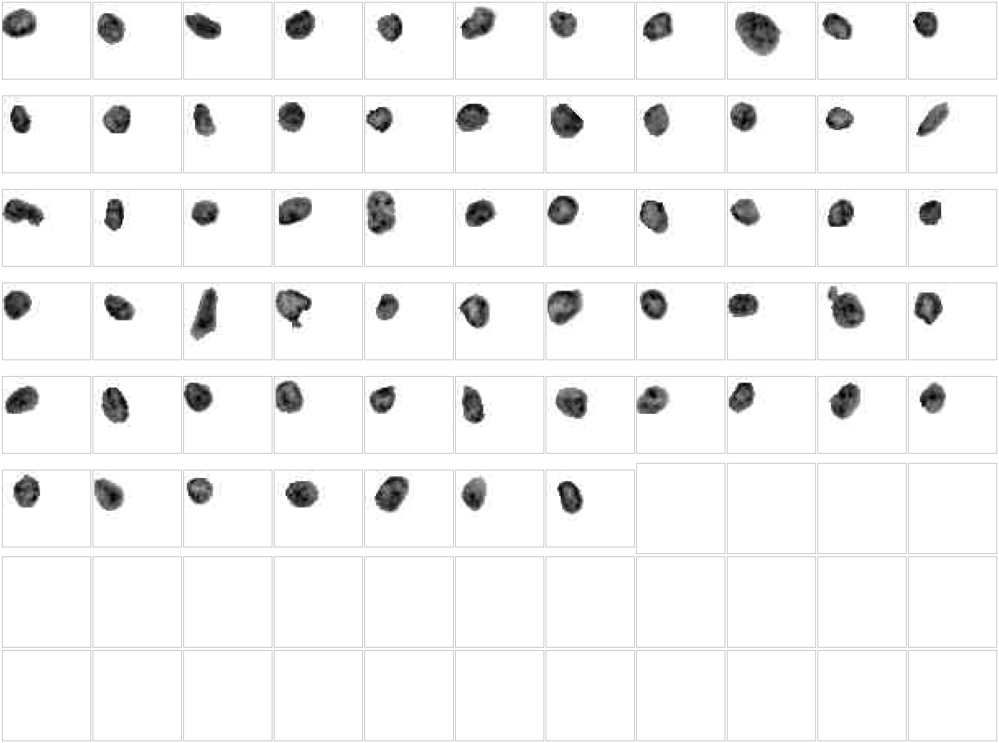

...

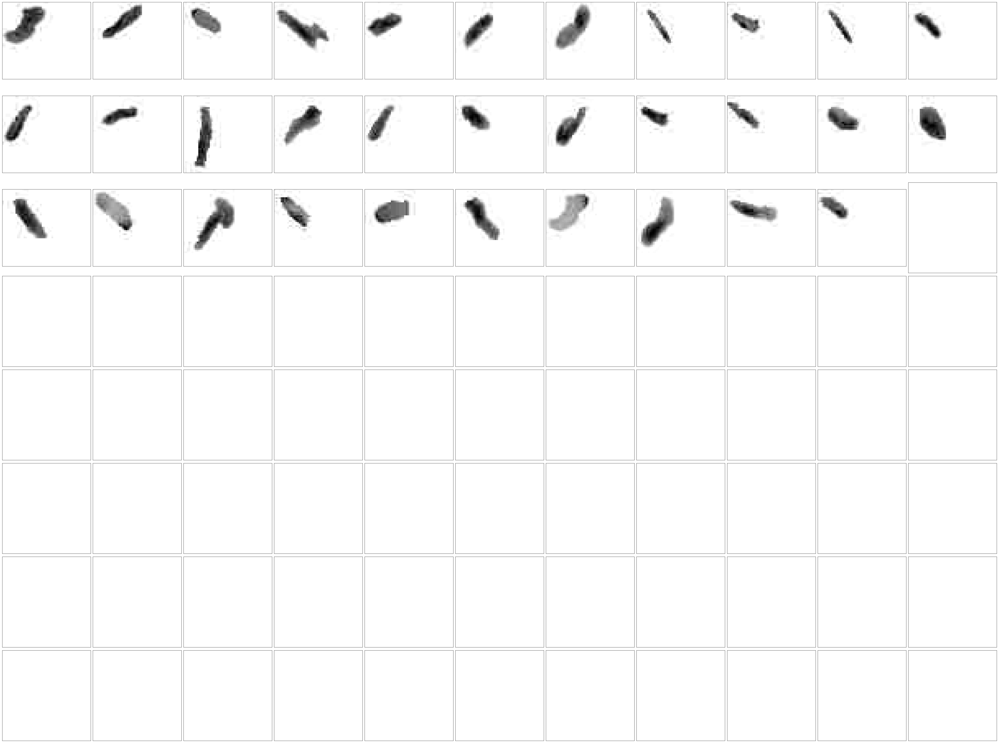

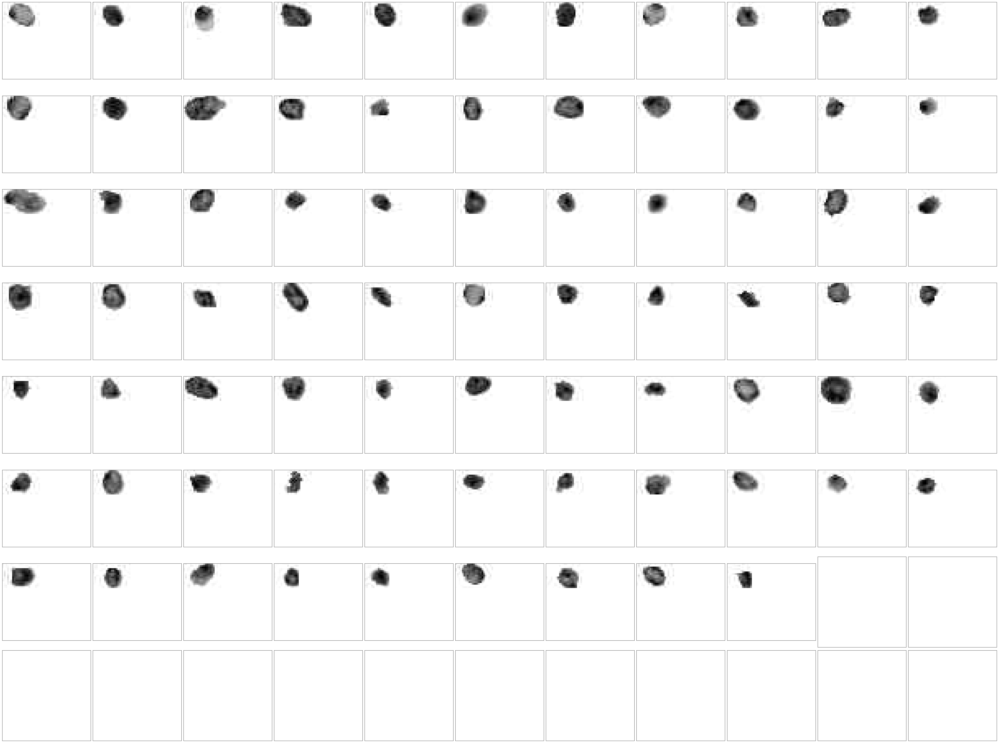

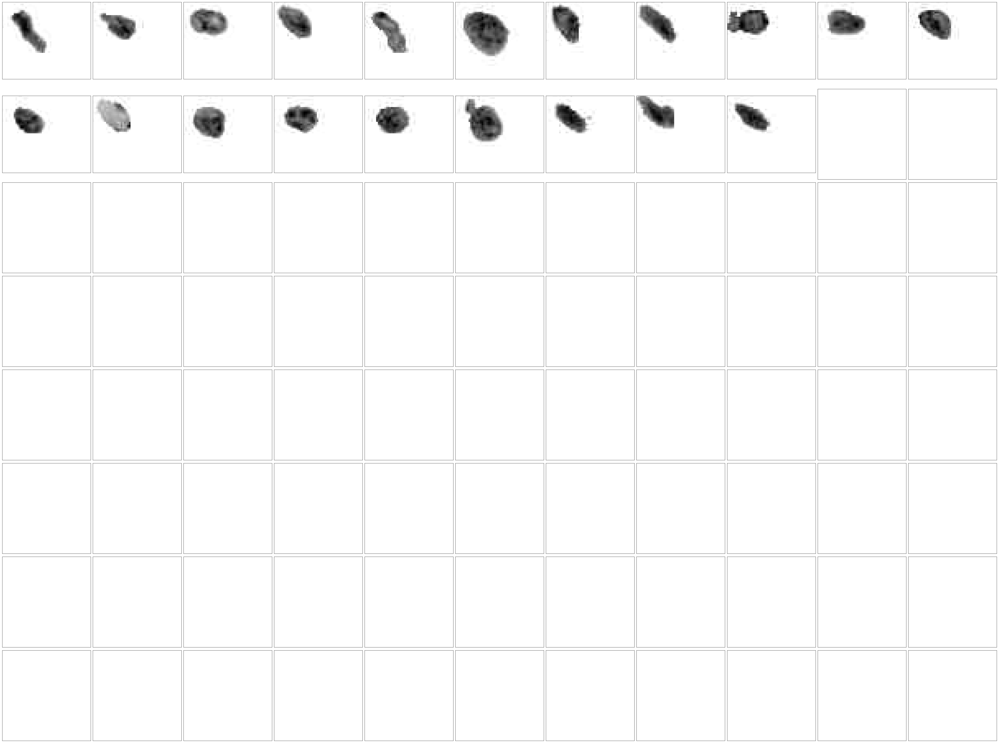

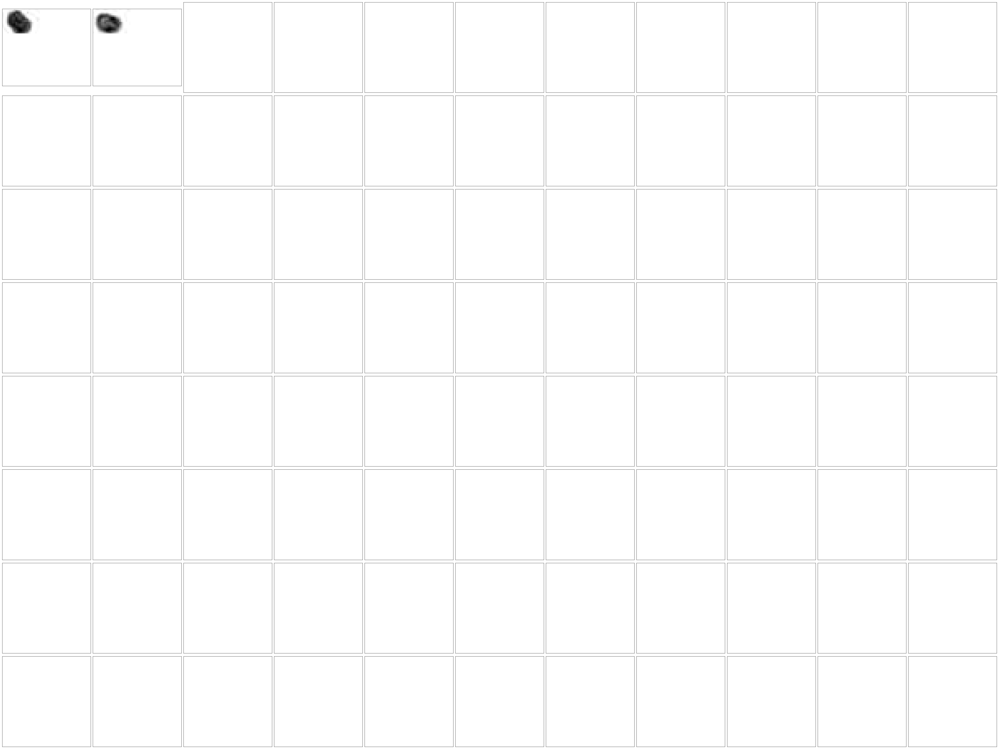

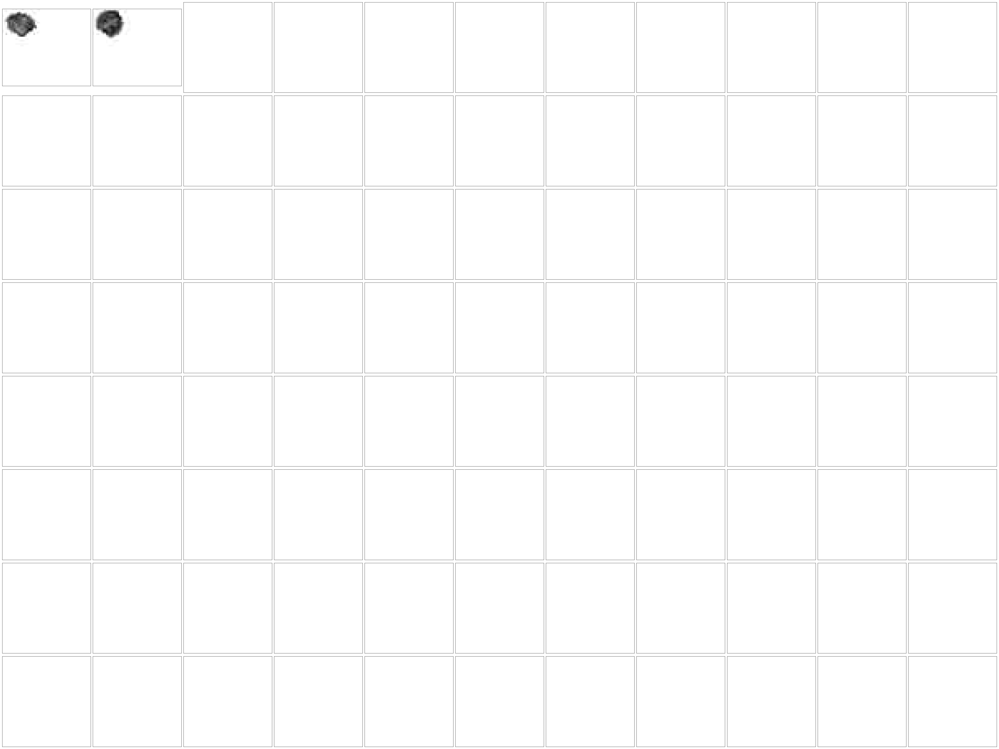

In [14]:
'''Plot the spatial projection of the modules'''
sns.set(style='white', context='notebook', rc={'figure.figsize':(80,60)})
ind = 0 
for group in range(len(groups)):
    print(group)
    spots = [graph['nodes'][node] for node in groups[group]]
    l = list(set([item for sublist in spots for item in sublist]))
    
    fig, ax_array = plt.subplots(8,11)
    axes = ax_array.flatten()
    for i, ax in enumerate(axes):
        if i < len(l):
            ax.imshow(images[l[i]], cmap='gray_r')
        if i >= len(l):
#             ax.imshow(images[l[-1]], cmap='gray_r')
            continue
    plt.setp(axes, xticks=[], yticks=[], frame_on=True)
    plt.tight_layout(h_pad=0.5, w_pad=0.01)
    plt.savefig(str(group)+'.png')